# <a name="0">Hierarchical Clustering</a>

1. <a href="#0">Read the dataset</a>
2. <a href="#2">Data investigation</a>
3. <a href="#3">Data preprocessing </a>
4. <a href="#4">Features transformation </a>
5. <a href="#5">K means</a>
6. <a href="#5">Training datasets</a>
7. <a href="#6">Improvement ideas</a>



In [81]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

## 1. <a name="1">Read the dataset</a>

In [82]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [83]:
#read the data

data_path = '/content/drive/MyDrive/CC_GENERAL.csv'
df = pd.read_csv(data_path)

print('The shape of the dataset is:', df.shape)

The shape of the dataset is: (8950, 18)


## 2. <a name="2">Data investigation</a>
(<a href="#0">Go to top</a>)

check for:
- null values in each column
- each column has the proper data type
- outliers
- duplicate rows
- distribution for each column (skewness)
<br>

In [84]:
# Let's see the data types and non-null values for each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [85]:
round(df.isnull().sum(axis=0)*100/df.shape[0],2)

CUST_ID                             0.00
BALANCE                             0.00
BALANCE_FREQUENCY                   0.00
PURCHASES                           0.00
ONEOFF_PURCHASES                    0.00
INSTALLMENTS_PURCHASES              0.00
CASH_ADVANCE                        0.00
PURCHASES_FREQUENCY                 0.00
ONEOFF_PURCHASES_FREQUENCY          0.00
PURCHASES_INSTALLMENTS_FREQUENCY    0.00
CASH_ADVANCE_FREQUENCY              0.00
CASH_ADVANCE_TRX                    0.00
PURCHASES_TRX                       0.00
CREDIT_LIMIT                        0.01
PAYMENTS                            0.00
MINIMUM_PAYMENTS                    3.50
PRC_FULL_PAYMENT                    0.00
TENURE                              0.00
dtype: float64

In [86]:
missing_values_count = df.isna().sum(axis = 0)
missing_values_count

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [87]:
import seaborn as sns

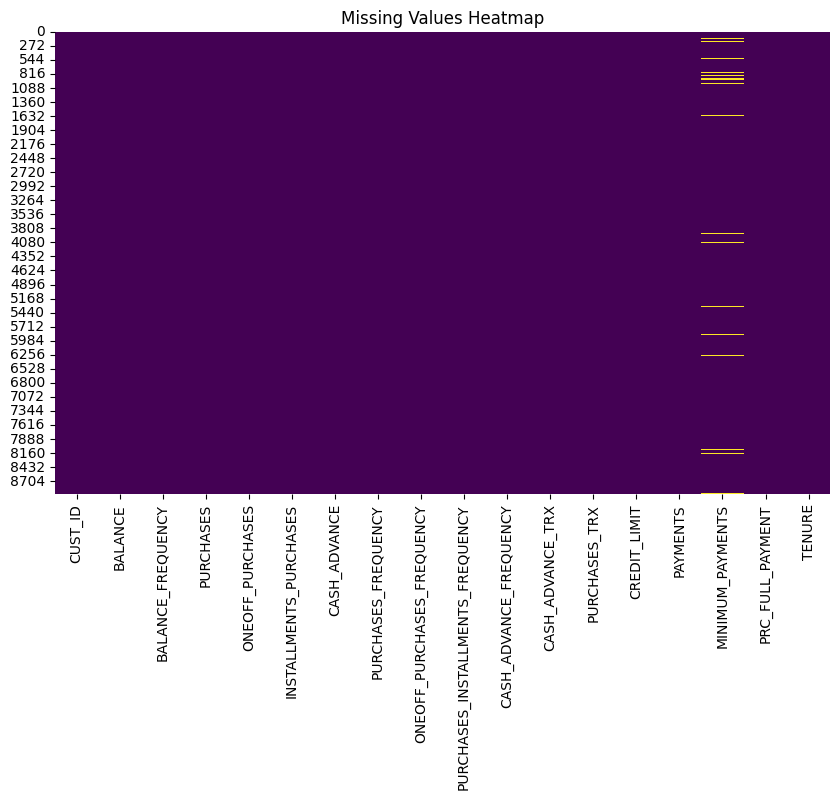

In [88]:
# missing values heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cmap='viridis', cbar=False)
plt.title('Missing Values Heatmap')
plt.show()

In [89]:
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [90]:
# This will print basic statistics for numerical columns
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [91]:
# feel free to investigate what you want

<Axes: >

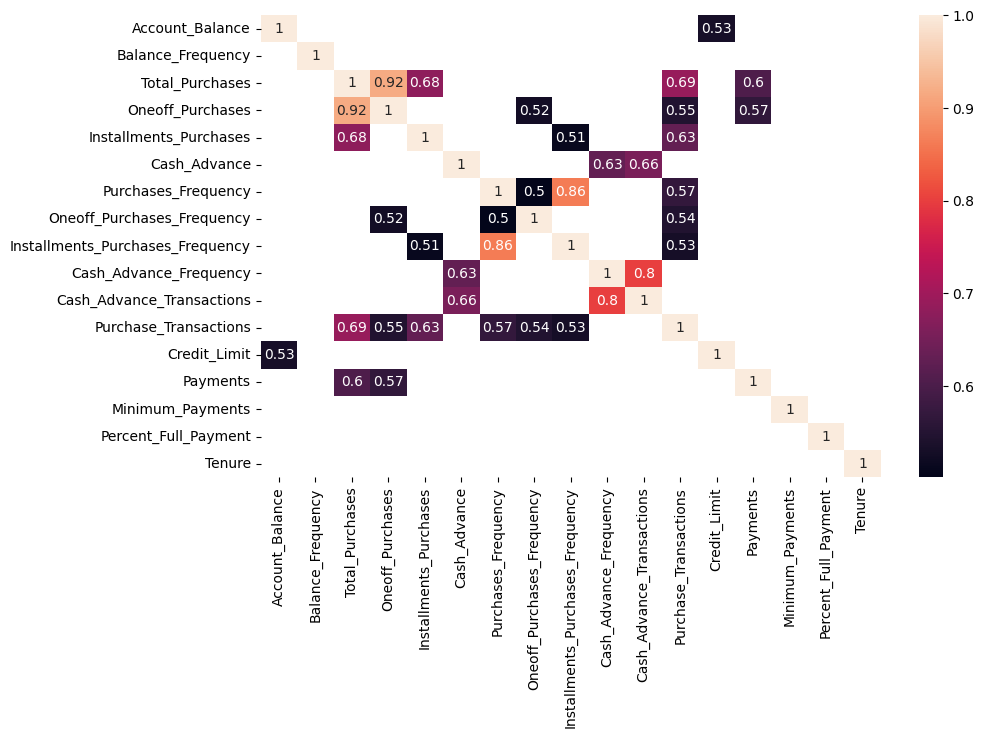

In [92]:
# Generate correlation matrix
df_corr = df.rename(columns={
    'CUST_ID': 'Customer_ID',
    'BALANCE': 'Account_Balance',
    'BALANCE_FREQUENCY': 'Balance_Frequency',
    'PURCHASES': 'Total_Purchases',
    'ONEOFF_PURCHASES': 'Oneoff_Purchases',
    'INSTALLMENTS_PURCHASES': 'Installments_Purchases',
    'CASH_ADVANCE': 'Cash_Advance',
    'PURCHASES_FREQUENCY': 'Purchases_Frequency',
    'ONEOFF_PURCHASES_FREQUENCY': 'Oneoff_Purchases_Frequency',
    'PURCHASES_INSTALLMENTS_FREQUENCY': 'Installments_Purchases_Frequency',
    'CASH_ADVANCE_FREQUENCY': 'Cash_Advance_Frequency',
    'CASH_ADVANCE_TRX': 'Cash_Advance_Transactions',
    'PURCHASES_TRX': 'Purchase_Transactions',
    'CREDIT_LIMIT': 'Credit_Limit',
    'PAYMENTS': 'Payments',
    'MINIMUM_PAYMENTS': 'Minimum_Payments',
    'PRC_FULL_PAYMENT': 'Percent_Full_Payment',
    'TENURE': 'Tenure'
})
plt.figure(figsize=(10,6))
corr_f = df_corr.iloc[:,1:].corr()
sns.heatmap(corr_f[abs(corr_f) > 0.5] , annot=True)

In [93]:
from matplotlib.ticker import FuncFormatter
def to_percent(x, position):
    # Convert the raw value to percentage
    return '{:.0f}%'.format(x * (10**-2))

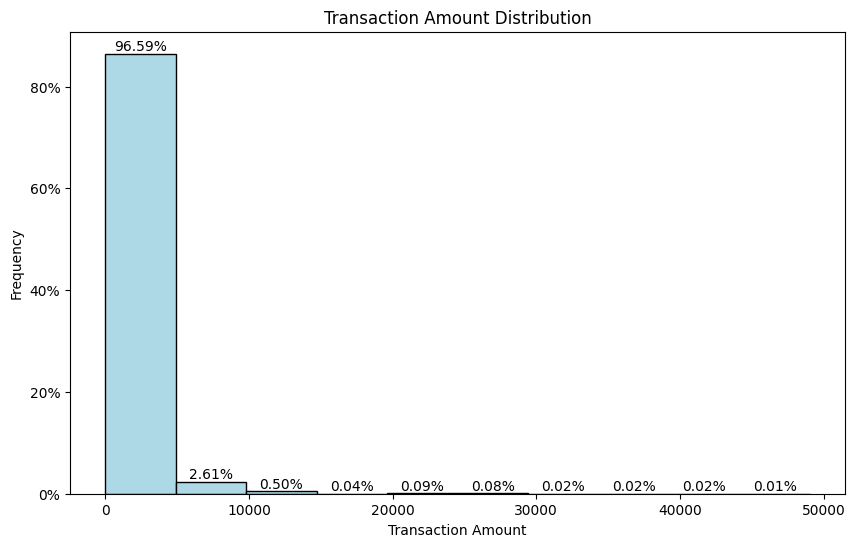

In [94]:
plt.figure(figsize=(10, 6))
n, bins, patches = plt.hist(df['PURCHASES'], bins=10, color='lightblue', edgecolor='black')
plt.title('Transaction Amount Distribution')
plt.xlabel('Transaction Amount')
plt.ylabel('Frequency')
plt.gca().yaxis.set_major_formatter(FuncFormatter(to_percent))
for freq, bar in zip(n, patches):
    percent = freq / len(df['PURCHASES']) * 100
    plt.text(bar.get_x() + bar.get_width() / 2, freq, f'{percent:.2f}%', ha='center', va='bottom')
plt.show()

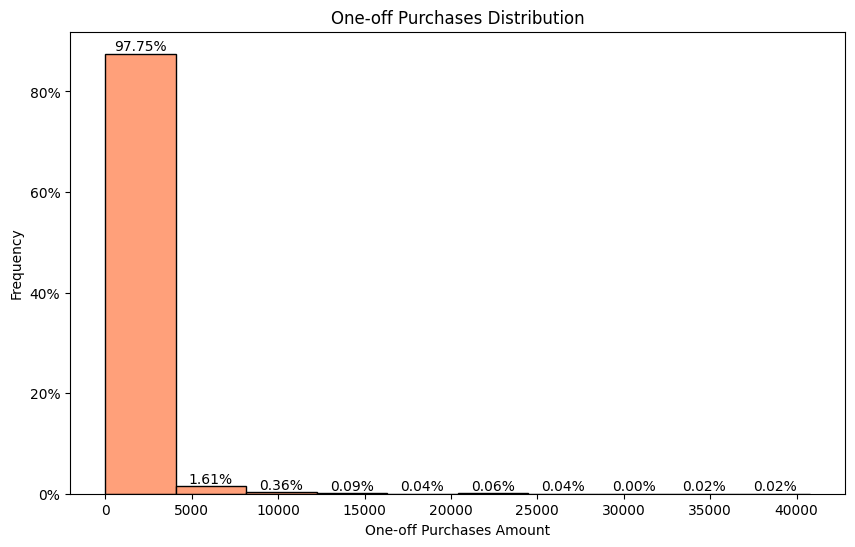

In [95]:
# distribution of one-off purchase amounts
plt.figure(figsize=(10, 6))
n, bins, patches = plt.hist(df['ONEOFF_PURCHASES'], bins=10, color='lightsalmon', edgecolor='black')
plt.title('One-off Purchases Distribution')
plt.xlabel('One-off Purchases Amount')
plt.ylabel('Frequency')

plt.gca().yaxis.set_major_formatter(FuncFormatter(to_percent))

total_count = len(df['ONEOFF_PURCHASES'])
for freq, bar in zip(n, patches):
    percent = freq / total_count * 100
    plt.text(bar.get_x() + bar.get_width() / 2, freq, f'{percent:.2f}%', ha='center', va='bottom')

plt.show()

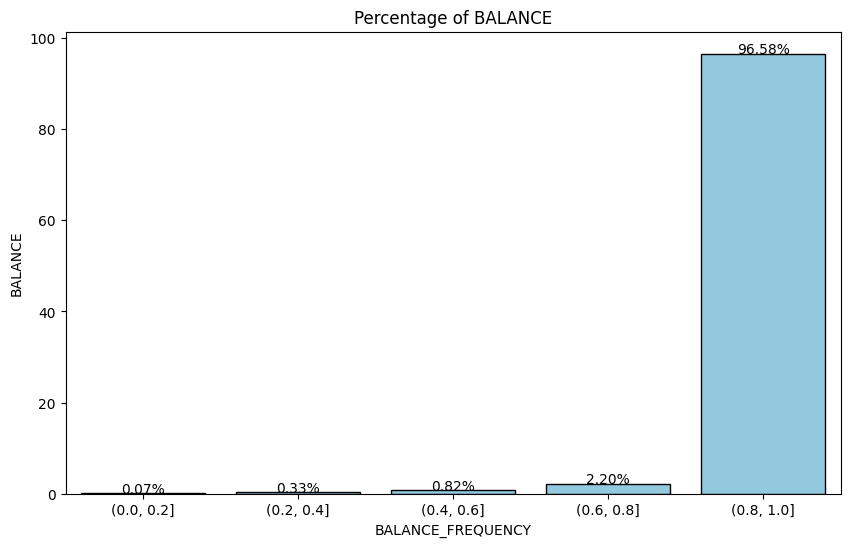

In [96]:
bins = [0, 0.2, 0.4, 0.6, 0.8, 1]

# Bin the 'BALANCE_FREQUENCY' column
df['BALANCE_FREQUENCY_BIN'] = pd.cut(df['BALANCE_FREQUENCY'], bins=bins)

# Aggregate data by 'BALANCE_FREQUENCY_BIN' and calculate the sum 'BALANCE' for each bin
bin_sum = df.groupby('BALANCE_FREQUENCY_BIN')['BALANCE'].sum().reset_index()

# Calculate the percentage of each bin relative to the total sum of 'BALANCE'
total_balance = df['BALANCE'].sum()
bin_sum['BALANCE_PERCENTAGE'] = (bin_sum['BALANCE'] / total_balance) * 100

# Create a bar plot
plt.figure(figsize=(10, 6))
sns.barplot(data=bin_sum, x='BALANCE_FREQUENCY_BIN', y='BALANCE_PERCENTAGE', color='skyblue', edgecolor='black')

# Add percentage text on top of each bar
for index, row in bin_sum.iterrows():
    plt.text(index, row['BALANCE_PERCENTAGE'], f'{row["BALANCE_PERCENTAGE"]:.2f}%', color='black', ha="center")

plt.title('Percentage of BALANCE')
plt.xlabel('BALANCE_FREQUENCY')
plt.ylabel('BALANCE')

plt.show()

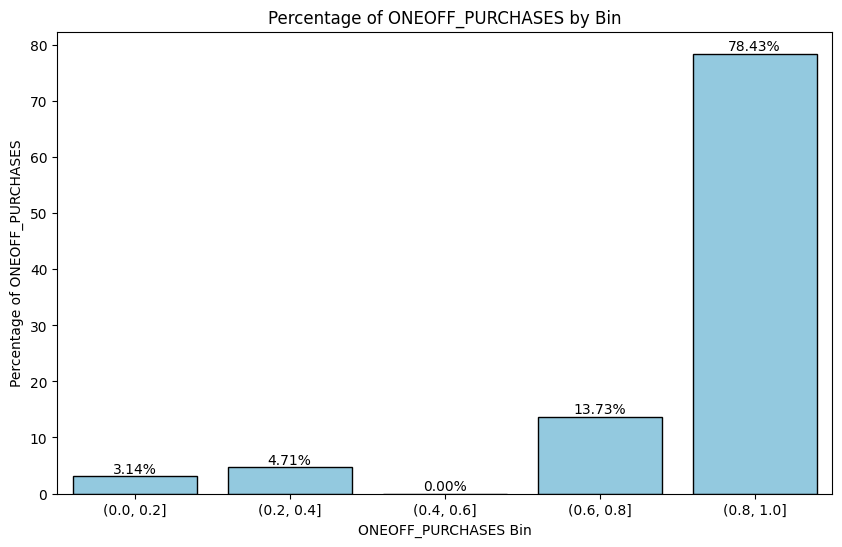

In [97]:
bins = [0, 0.2, 0.4, 0.6, 0.8, 1]

# Bin the 'ONEOFF_PURCHASES' column
df['ONEOFF_PURCHASES_BIN'] = pd.cut(df['ONEOFF_PURCHASES'], bins=bins)

# Aggregate data by 'ONEOFF_PURCHASES_BIN' and calculate the sum of 'ONEOFF_PURCHASES' for each bin
bin_sum = df.groupby('ONEOFF_PURCHASES_BIN')['ONEOFF_PURCHASES'].sum().reset_index()

# Calculate the percentage of each bin relative to the total sum of 'ONEOFF_PURCHASES'
total_oneoff = bin_sum['ONEOFF_PURCHASES'].sum()
bin_sum['ONEOFF_PERCENTAGE'] = (bin_sum['ONEOFF_PURCHASES'] / total_oneoff) * 100

# Create a bar plot
plt.figure(figsize=(10, 6))
sns.barplot(data=bin_sum, x='ONEOFF_PURCHASES_BIN', y='ONEOFF_PERCENTAGE', color='skyblue', edgecolor='black')

# Add percentage text on top of each bar
for index, row in bin_sum.iterrows():
    plt.text(index, row['ONEOFF_PERCENTAGE'], f'{row["ONEOFF_PERCENTAGE"]:.2f}%', color='black', ha="center", va="bottom")

plt.title('Percentage of ONEOFF_PURCHASES by Bin')
plt.xlabel('ONEOFF_PURCHASES Bin')
plt.ylabel('Percentage of ONEOFF_PURCHASES')

plt.show()

<Axes: xlabel='BALANCE', ylabel='PURCHASES'>

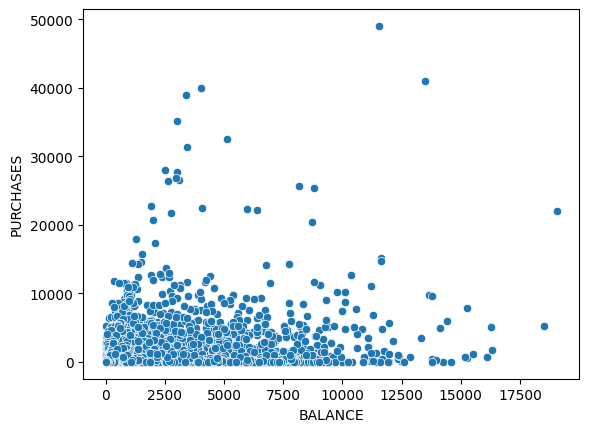

In [98]:
sns.scatterplot(data=df , x='BALANCE' , y='PURCHASES')

## 3. <a name="3">Data preprocessing</a>
(<a href="#0">Go to top</a>)


In [99]:
#make a copy for the original dataset
df_copy=df.copy()

### for each issue adapt this methodology
- start by defining the solution
- apply this solution onn the data
- test the solution to make sure that you have solved the issue

**First issue**

In [100]:
#solution
median_credit_limit = df_copy['CREDIT_LIMIT'].median()
df_copy['CREDIT_LIMIT'].fillna(median_credit_limit, inplace=True)

In [101]:
#test
missing_values_count = df_copy.isna().sum(axis = 0)
missing_values_count

CUST_ID                                0
BALANCE                                0
BALANCE_FREQUENCY                      0
PURCHASES                              0
ONEOFF_PURCHASES                       0
INSTALLMENTS_PURCHASES                 0
CASH_ADVANCE                           0
PURCHASES_FREQUENCY                    0
ONEOFF_PURCHASES_FREQUENCY             0
PURCHASES_INSTALLMENTS_FREQUENCY       0
CASH_ADVANCE_FREQUENCY                 0
CASH_ADVANCE_TRX                       0
PURCHASES_TRX                          0
CREDIT_LIMIT                           0
PAYMENTS                               0
MINIMUM_PAYMENTS                     313
PRC_FULL_PAYMENT                       0
TENURE                                 0
BALANCE_FREQUENCY_BIN                 80
ONEOFF_PURCHASES_BIN                8934
dtype: int64

In [102]:
#solution
median_min_payments = df_copy['MINIMUM_PAYMENTS'].median()
df_copy['MINIMUM_PAYMENTS'].fillna(median_min_payments, inplace=True)

In [103]:
#test
missing_values_count = df_copy.isna().sum(axis = 0)
missing_values_count

CUST_ID                                0
BALANCE                                0
BALANCE_FREQUENCY                      0
PURCHASES                              0
ONEOFF_PURCHASES                       0
INSTALLMENTS_PURCHASES                 0
CASH_ADVANCE                           0
PURCHASES_FREQUENCY                    0
ONEOFF_PURCHASES_FREQUENCY             0
PURCHASES_INSTALLMENTS_FREQUENCY       0
CASH_ADVANCE_FREQUENCY                 0
CASH_ADVANCE_TRX                       0
PURCHASES_TRX                          0
CREDIT_LIMIT                           0
PAYMENTS                               0
MINIMUM_PAYMENTS                       0
PRC_FULL_PAYMENT                       0
TENURE                                 0
BALANCE_FREQUENCY_BIN                 80
ONEOFF_PURCHASES_BIN                8934
dtype: int64

In [104]:
# Drop the 'CUST_ID' column from the original DataFrame
df_copy.drop(columns=['CUST_ID'], inplace=True)
df_copy.drop(columns=['BALANCE_FREQUENCY_BIN'], inplace=True)
df_copy.drop(columns=['ONEOFF_PURCHASES_BIN'], inplace=True)
df_copy.drop(columns=['ONEOFF_PURCHASES'], inplace=True)
df_copy.drop(columns=['MINIMUM_PAYMENTS'], inplace=True)

In [105]:
df_copy.isna().sum(axis = 0)

BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

**Second issue**

In [106]:
#solution

df_copy = df_copy[df_copy['CASH_ADVANCE_FREQUENCY']<=1]
df_copy.reset_index(drop=True, inplace=True)

In [107]:
# test
df_copy.shape

(8942, 15)

In [108]:
# 8 rows were having cash advance frequency more than 1

In [109]:
df_copy[(df_copy['PURCHASES_FREQUENCY'] <= 1) & (df_copy['ONEOFF_PURCHASES_FREQUENCY'] <= 1) & (df_copy['PURCHASES_INSTALLMENTS_FREQUENCY'] <= 1)]
df_copy.reset_index(drop=True, inplace=True)

In [110]:
df_copy.shape

(8942, 15)

In [111]:
df_copy.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,0.000000,12
1,3202.467416,0.909091,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,0.222222,12
2,2495.148862,1.000000,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,0.000000,12
3,1666.670542,0.636364,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,0.000000,12
4,817.714335,1.000000,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,0.000000,12


## 4. <a name="4">Features transformation</a>
(<a href="#0">Go to top</a>)

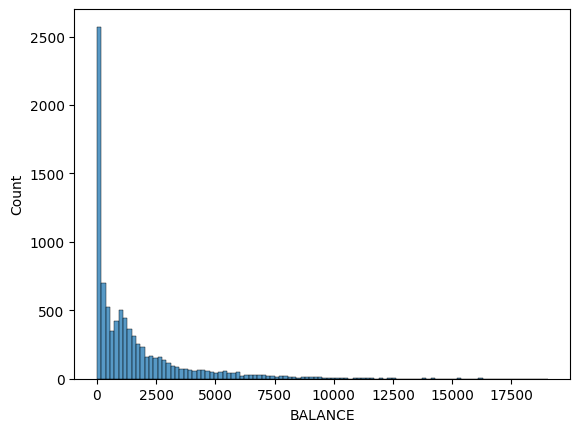

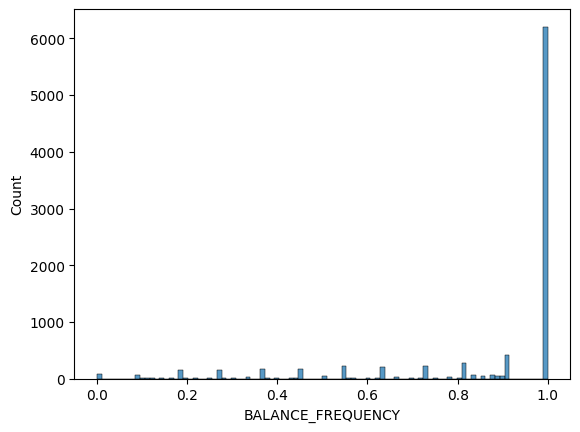

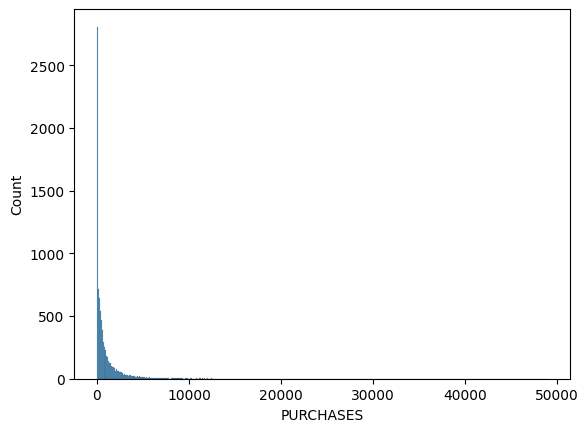

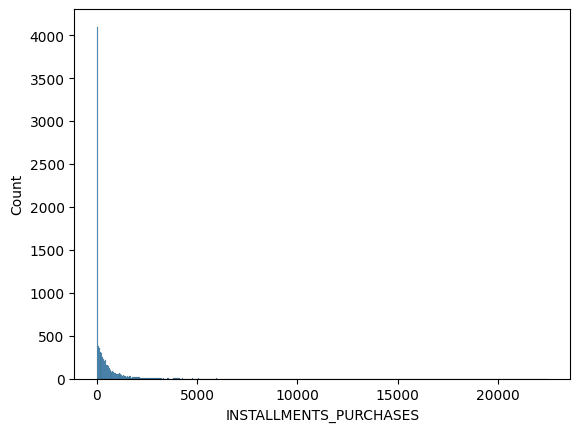

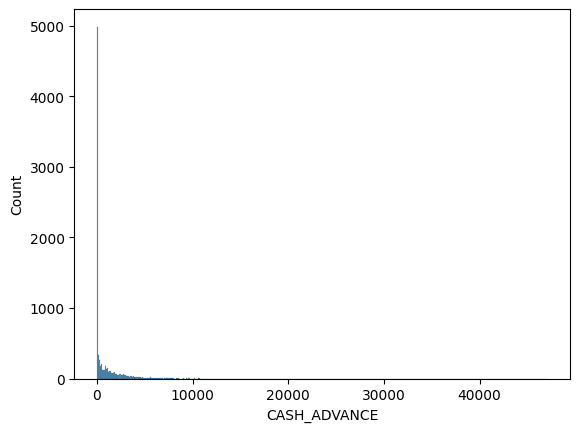

...

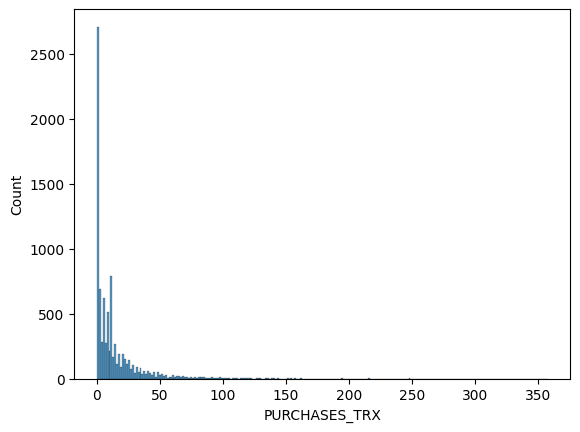

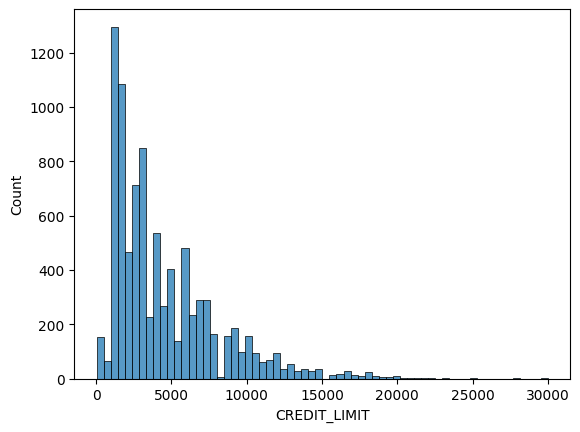

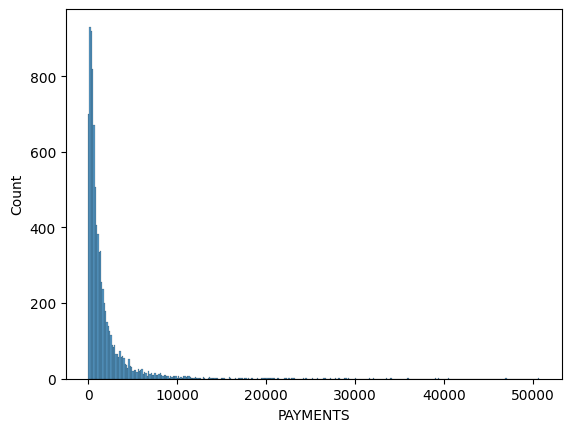

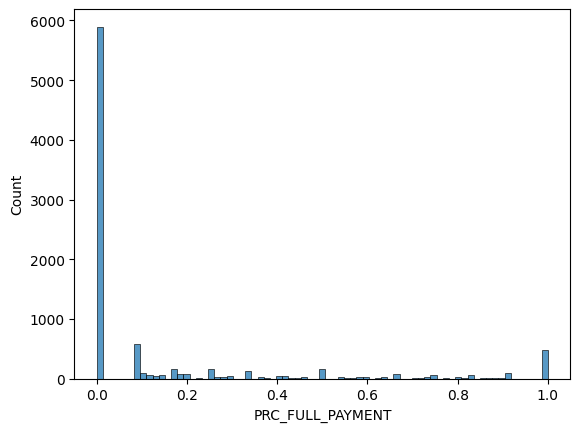

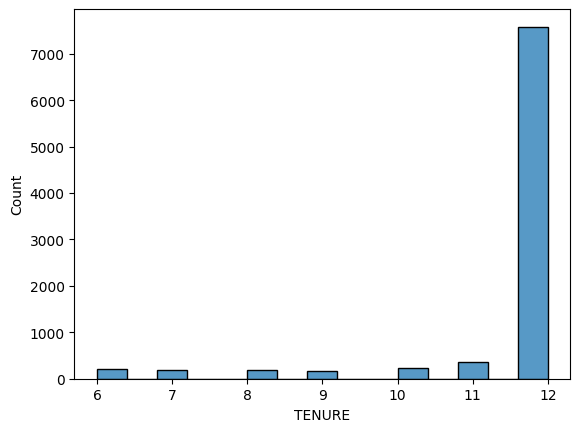

In [112]:
col = df_copy.columns
for i in range(len(col)):
    sns.histplot(data = df_copy,x = col[i])
    plt.show()

In [113]:
# Columns with high skewness: 'BALANCE', 'PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE','CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS'

In [114]:
cols_to_transform = ['BALANCE', 'PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
                        'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS']
epsilon = 1e-10
# Apply log transformation with handling zero values
df_copy[cols_to_transform] = df_copy[cols_to_transform].apply(lambda x: np.log1p(x + epsilon))

In [115]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler, RobustScaler, Normalizer

In [116]:
def plot_tsne(X_tsne, cluster_labels, title):
    plt.figure(figsize=(20, 10))
    plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=cluster_labels, cmap='viridis', alpha=0.5)
    plt.title(title)
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.show()

In [117]:
tsne = TSNE(n_components=2, random_state=42)

In [118]:
tsne_df = tsne.fit_transform(df_copy)

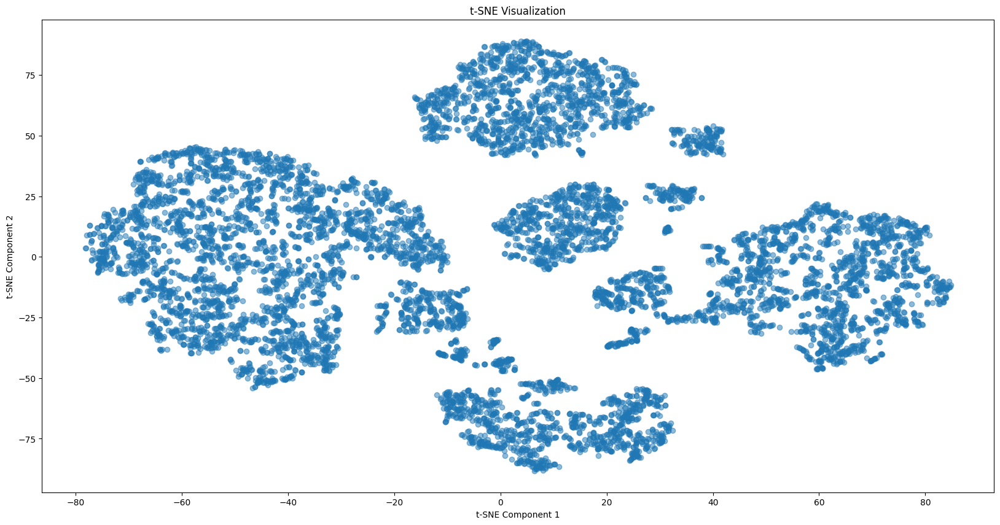

In [119]:
plot_tsne(tsne_df, None, title='t-SNE Visualization')

Standard Scalar


In [120]:
scaler_standard = StandardScaler()
X_standard_scaled = scaler_standard.fit_transform(df_copy)

In [121]:
X_tsne_standard = tsne.fit_transform(X_standard_scaled)

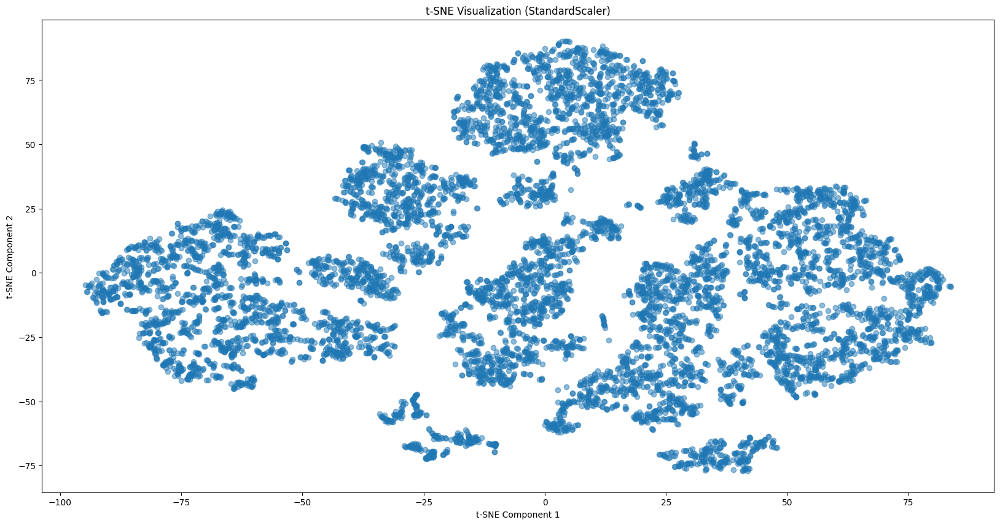

In [122]:
plot_tsne(X_tsne_standard, None, title='t-SNE Visualization (StandardScaler)')

Robust Scalar

In [123]:
scaler_robust = RobustScaler()
X_robust_scaled = scaler_robust.fit_transform(df_copy)

In [124]:
X_tsne_robust = tsne.fit_transform(X_robust_scaled)

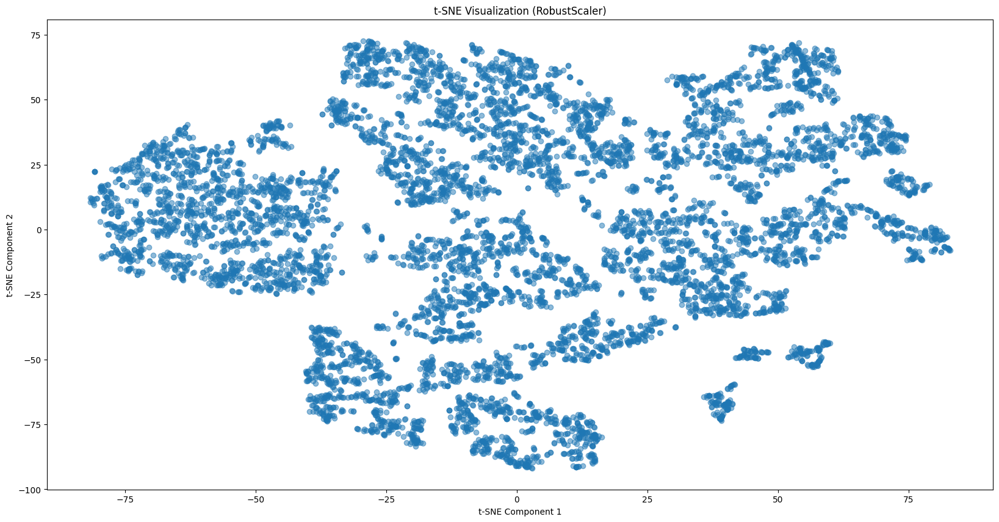

In [125]:
plot_tsne(X_tsne_robust, None, title='t-SNE Visualization (RobustScaler)')

Normalizer

In [126]:
scaler_normalizer = Normalizer()
X_normalized = scaler_normalizer.fit_transform(df_copy)

In [127]:
X_tsne_normalized = tsne.fit_transform(X_normalized)

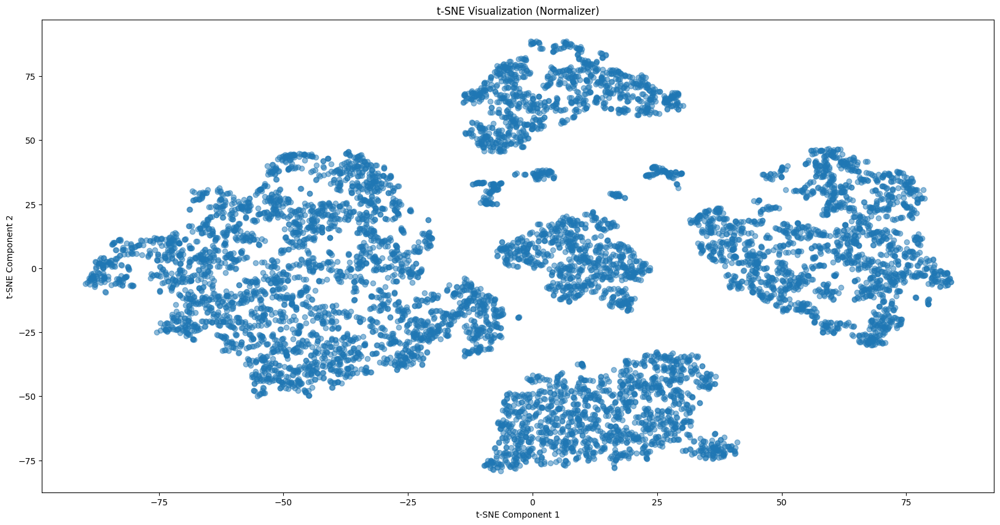

In [128]:
plot_tsne(X_tsne_normalized, None, title='t-SNE Visualization (Normalizer)')

In [129]:
from sklearn.decomposition import PCA
pca = PCA(n_components=0.999)
X_pca_normalized = pca.fit_transform(X_normalized)

In [130]:
X_tsne_pca_normalized = tsne.fit_transform(X_pca_normalized)

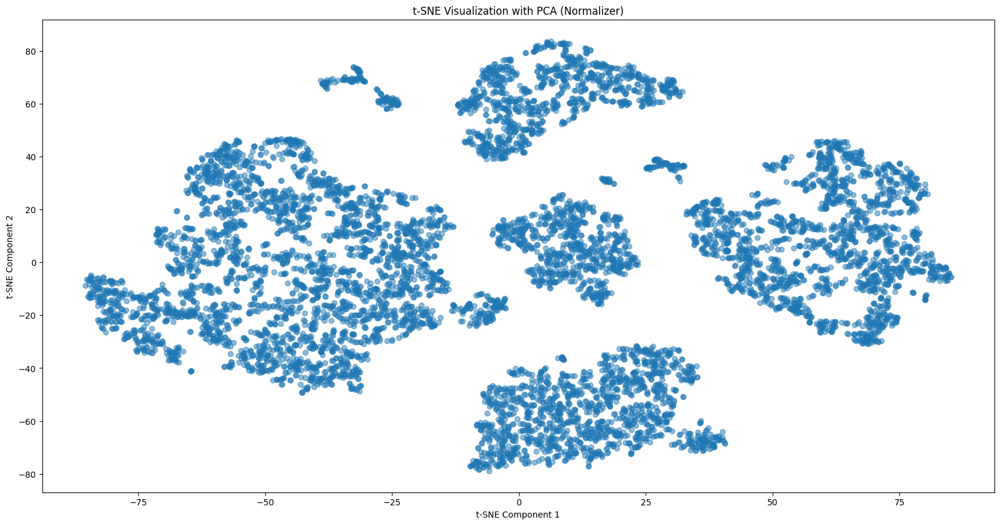

In [131]:
plot_tsne(X_tsne_pca_normalized, None, title='t-SNE Visualization with PCA (Normalizer)')

In [132]:
from sklearn.decomposition import KernelPCA

In [133]:
kernel_pca = KernelPCA(n_components=2, kernel='rbf', gamma=0.1)
X_kernel_pca = kernel_pca.fit_transform(X_normalized)

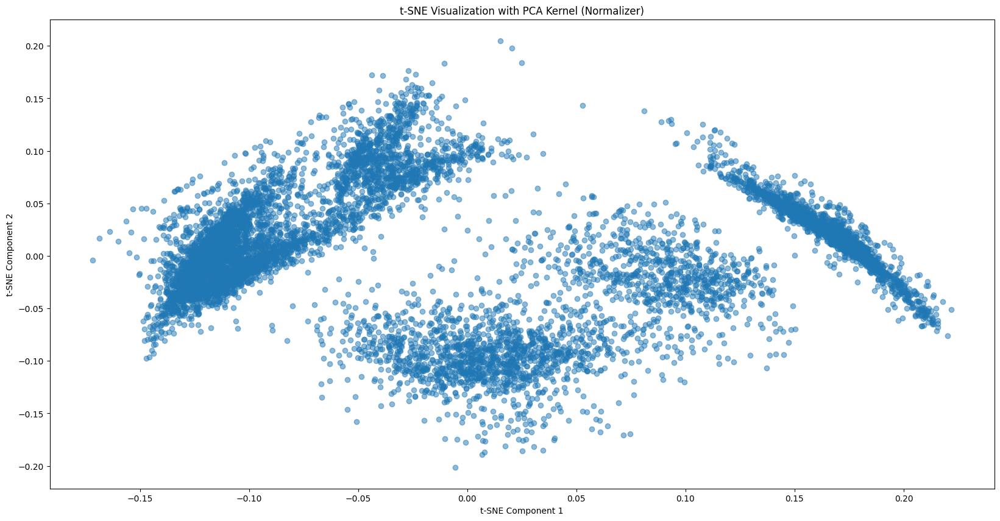

In [134]:
plot_tsne(X_kernel_pca, None, title='t-SNE Visualization with PCA Kernel (Normalizer)')

## 5. <a name="5">K Means</a>
(<a href="#5">Go to top</a>)

elbow method

In [135]:
pip install kneed

PCA

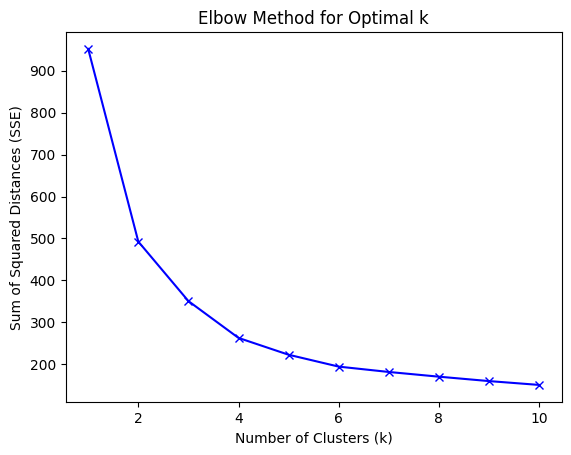

Optimal number of clusters (k): 3


In [136]:
from sklearn.cluster import KMeans
from kneed import KneeLocator

# Define a range of k values for KMeans
k_values = range(1, 11)

# SSE (sum of squared distances)
sse = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)

    kmeans.fit(X_pca_normalized)

    # Append the inertia (sum of squared distances) to the list
    sse.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(k_values, sse, 'bx-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Sum of Squared Distances (SSE)')
plt.title('Elbow Method for Optimal k')
plt.show()

# Use the KneeLocator to determine the elbow point (optimal K)
kl = KneeLocator(list(k_values), sse, curve='convex', direction='decreasing')

optimal_k = kl.elbow

print("Optimal number of clusters (k):", optimal_k)

In [137]:
kmeans = KMeans(n_clusters=optimal_k, random_state=42)

kmeans.fit(X_pca_normalized)

cluster_labels = kmeans.labels_

df_copy['cluster1'] = cluster_labels

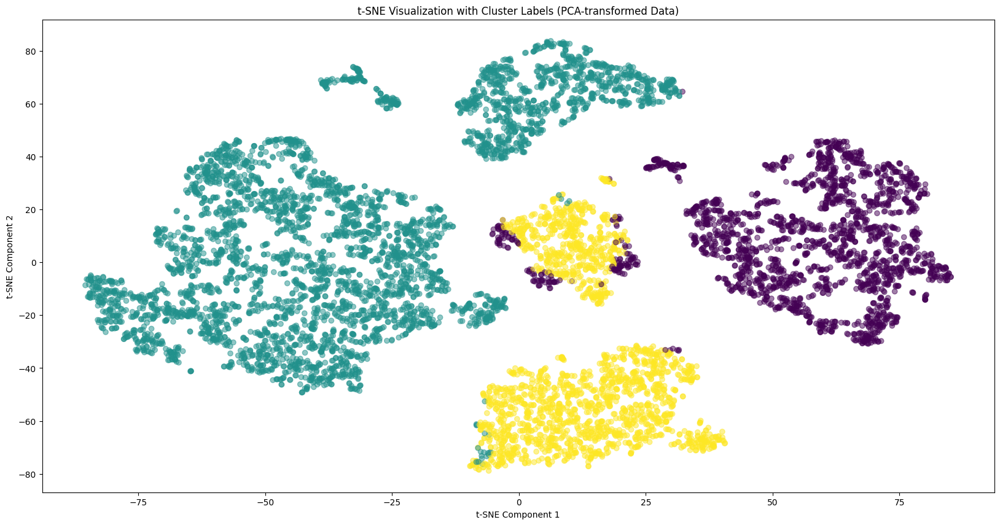

In [138]:
X_tsne_pca_with_labels = tsne.fit_transform(X_pca_normalized)

plot_tsne(X_tsne_pca_with_labels, cluster_labels, 't-SNE Visualization with Cluster Labels (PCA-transformed Data)')

Kernel PCA

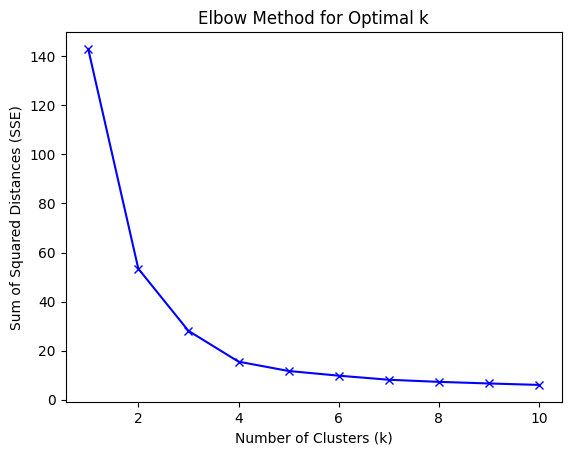

Optimal number of clusters (k): 3


In [139]:
# Define a range of k values for KMeans
k_values = range(1, 11)

# SSE (sum of squared distances)
sse = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)

    kmeans.fit(X_kernel_pca)

    # Append the inertia (sum of squared distances) to the list
    sse.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(k_values, sse, 'bx-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Sum of Squared Distances (SSE)')
plt.title('Elbow Method for Optimal k')
plt.show()

# Use the KneeLocator to determine the elbow point (optimal K)
kl = KneeLocator(list(k_values), sse, curve='convex', direction='decreasing')

optimal_k = kl.elbow

print("Optimal number of clusters (k):", optimal_k)

In [140]:
kmeans = KMeans(n_clusters=optimal_k, random_state=42)

kmeans.fit(X_kernel_pca)

cluster_labels = kmeans.labels_

df_copy['cluster2'] = cluster_labels

In [141]:
X_tsne_kernel_pca_with_labels = tsne.fit_transform(X_kernel_pca)

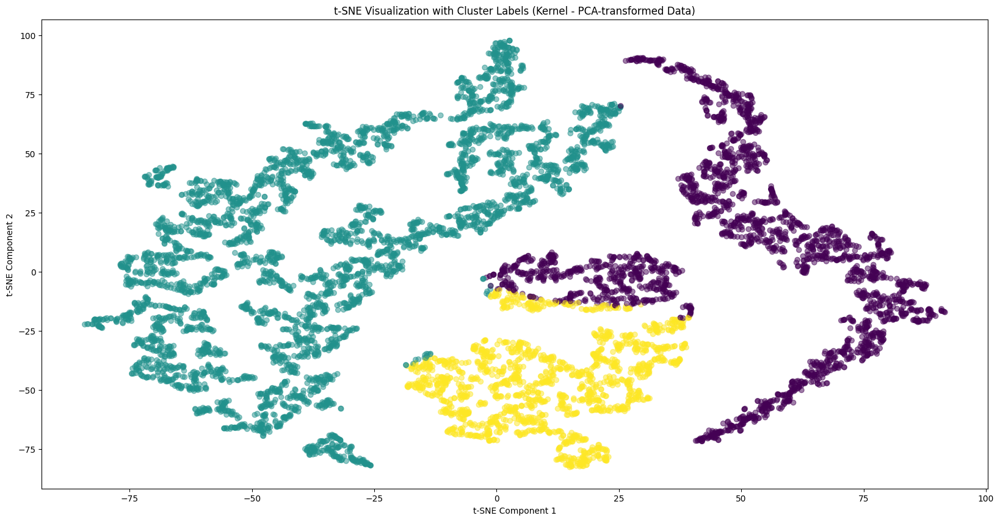

In [142]:
plot_tsne(X_tsne_kernel_pca_with_labels, cluster_labels, 't-SNE Visualization with Cluster Labels (Kernel - PCA-transformed Data)')

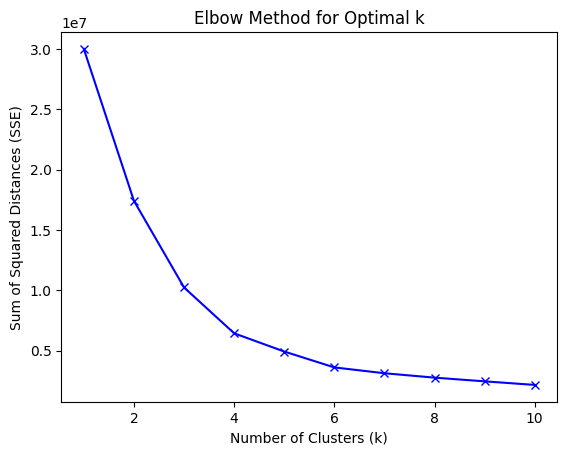

Optimal number of clusters (k): 4


In [143]:
# Define a range of k values for KMeans
k_values = range(1, 11)

# SSE (sum of squared distances)
sse = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)

    kmeans.fit(tsne_df)

    # Append the inertia (sum of squared distances) to the list
    sse.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(k_values, sse, 'bx-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Sum of Squared Distances (SSE)')
plt.title('Elbow Method for Optimal k')
plt.show()

# Use the KneeLocator to determine the elbow point (optimal K)
kl = KneeLocator(list(k_values), sse, curve='convex', direction='decreasing')

optimal_k = kl.elbow

print("Optimal number of clusters (k):", optimal_k)

In [144]:
kmeans = KMeans(n_clusters=optimal_k, random_state=42)

kmeans.fit(tsne_df)

cluster_labels = kmeans.labels_

df_copy['cluster3'] = cluster_labels

In [145]:
X_tsne = tsne.fit_transform(tsne_df)

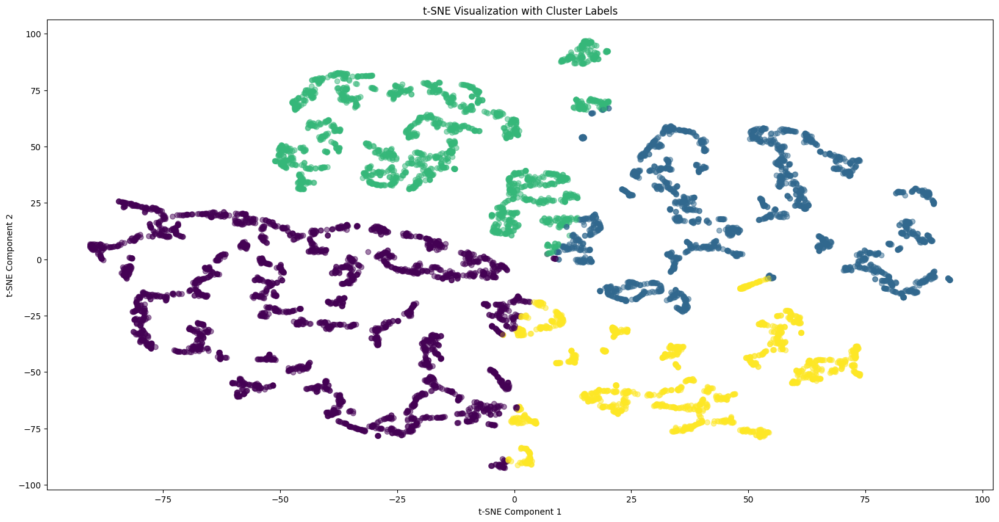

In [146]:
plot_tsne(X_tsne, cluster_labels, 't-SNE Visualization with Cluster Labels')

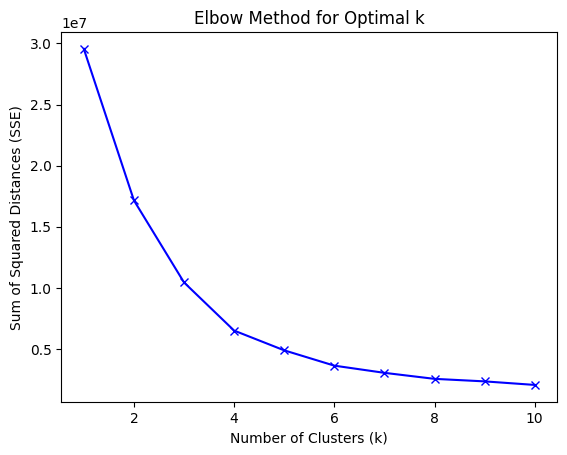

Optimal number of clusters (k): 4


In [147]:
# Define a range of k values for KMeans
k_values = range(1, 11)

# SSE (sum of squared distances)
sse = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)

    kmeans.fit(X_tsne_normalized)

    # Append the inertia (sum of squared distances) to the list
    sse.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(k_values, sse, 'bx-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Sum of Squared Distances (SSE)')
plt.title('Elbow Method for Optimal k')
plt.show()

# Use the KneeLocator to determine the elbow point (optimal K)
kl = KneeLocator(list(k_values), sse, curve='convex', direction='decreasing')

optimal_k = kl.elbow

print("Optimal number of clusters (k):", optimal_k)

In [148]:
kmeans = KMeans(n_clusters=optimal_k, random_state=42)

kmeans.fit(X_tsne_normalized)

cluster_labels = kmeans.labels_

df_copy['cluster4'] = cluster_labels

In [149]:
X_tsne_scaled = tsne.fit_transform(X_tsne_normalized)

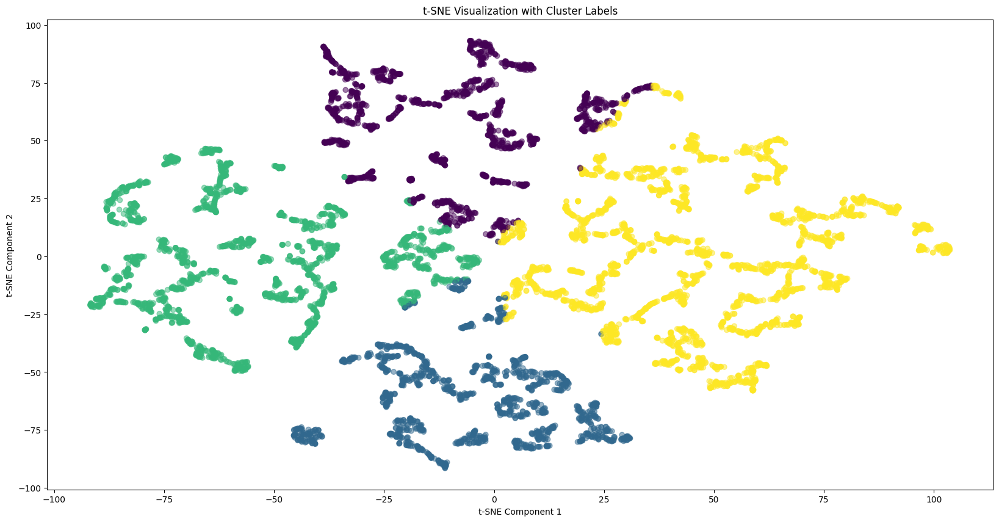

In [150]:
plot_tsne(X_tsne_scaled, cluster_labels, 't-SNE Visualization with Cluster Labels')

In [151]:
from sklearn.metrics import silhouette_score

# Calculate silhouette score for PCA-transformed data
silhouette_score_pca = silhouette_score(X_pca_normalized, df_copy['cluster1'])
print("Silhouette Score for PCA:", silhouette_score_pca)

# Calculate silhouette score for Kernel PCA-transformed data
silhouette_score_kernel_pca = silhouette_score(X_kernel_pca, df_copy['cluster2'])
print("Silhouette Score for Kernel PCA:", silhouette_score_kernel_pca)

# Calculate silhouette score for non scaled data
silhouette_score_non_scale = silhouette_score(tsne_df, df_copy['cluster3'])
print("Silhouette Score for non scaled:", silhouette_score_non_scale)

# Calculate silhouette score for standard scaled data
silhouette_score_std_scale = silhouette_score(X_tsne_normalized, df_copy['cluster4'])
print("Silhouette Score for normalized:", silhouette_score_std_scale)

Silhouette Score for PCA: 0.42735897616020174
Silhouette Score for Kernel PCA: 0.5915307828991214
Silhouette Score for non scaled: 0.48005974
Silhouette Score for normalized: 0.47160062


Kernel PCA is the best

## 6. <a name="5">Training and hyperparamter tuning</a>
(<a href="#0">Go to top</a>)


Before we start the training process we need to specify 3 paramters:<br>
1- Linkage criteria : The linkage criterion determines the distance between two clusters
    - Complete-Linkage Clustering
    - Single-Linkage Clustering
    - Average-Linkage Clustering
    - Centroid Linkage Clustering
2- Distance function:
    - Euclidean Distance
    - Manhattan Distance
    - Mahalanobis distance
3- Number of clusters


### *Number of clusters*
Use Dendograms to specify the optimum number of clusters
- Compare how changing linkage criteria or distance function would affect the optimum number of clusters
- you can use silhouette_score or any other evalution method to help you determine the optimum number of clusters
https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html

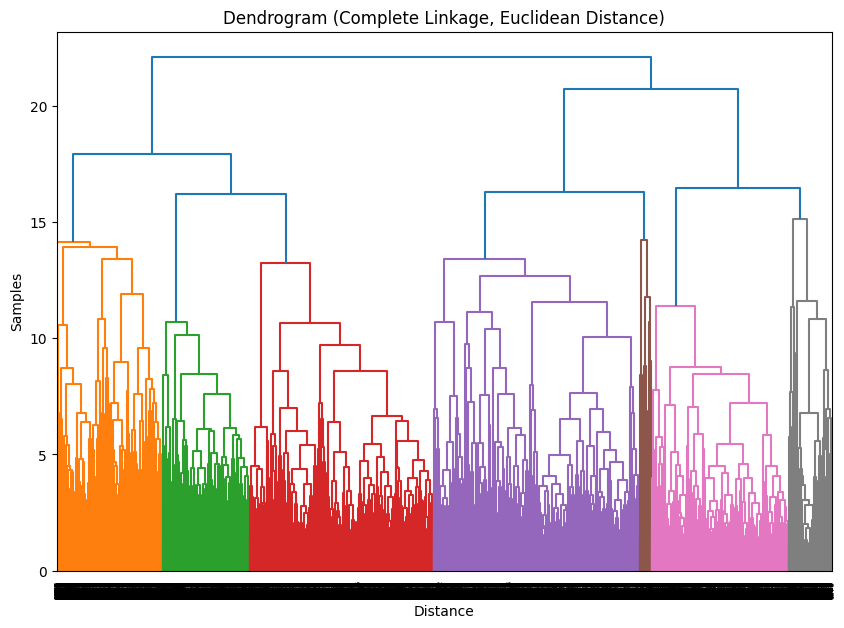

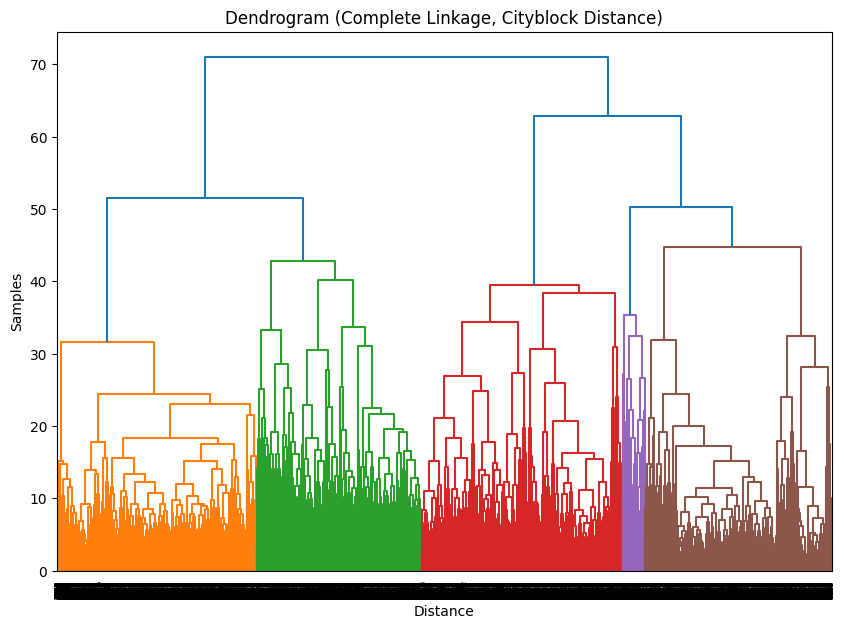

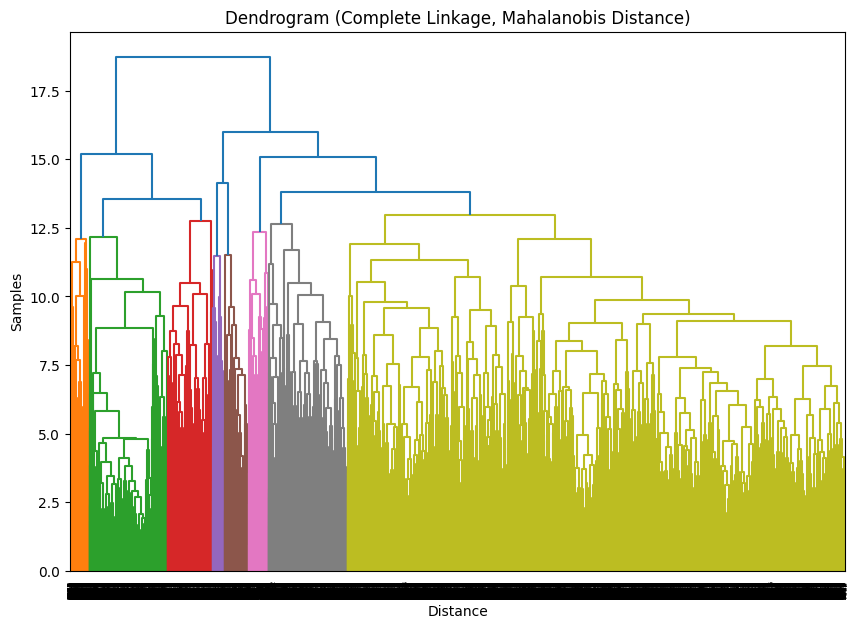

RecursionError encountered for Single linkage and Euclidean distance. Skipping...
RecursionError encountered for Single linkage and Cityblock distance. Skipping...
RecursionError encountered for Single linkage and Mahalanobis distance. Skipping...


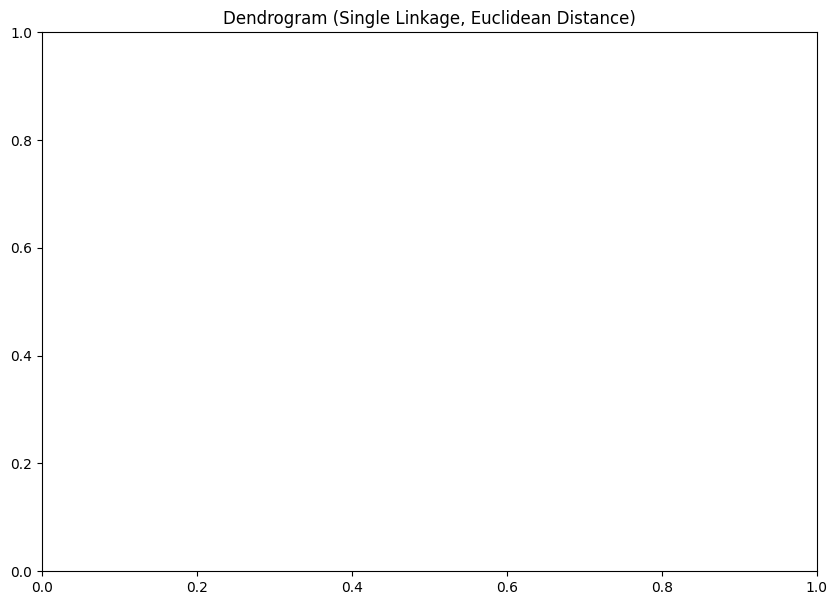

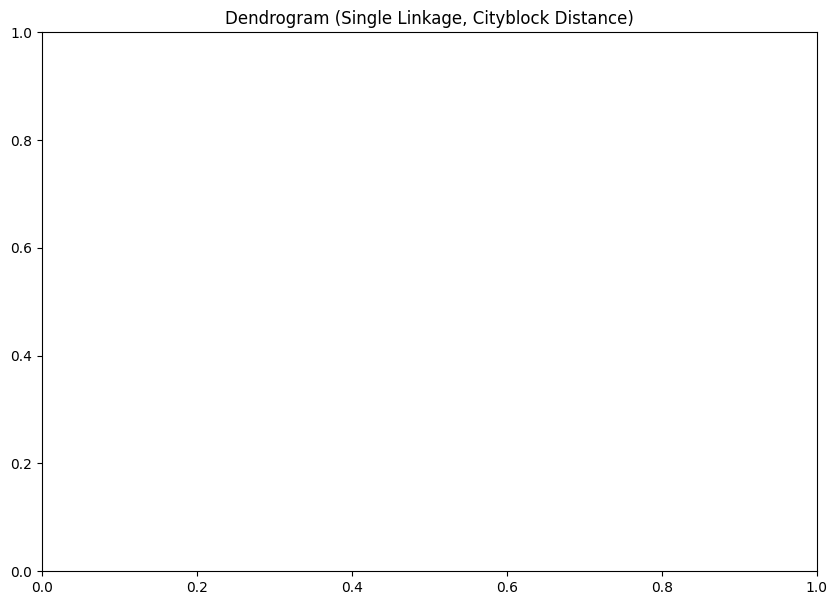

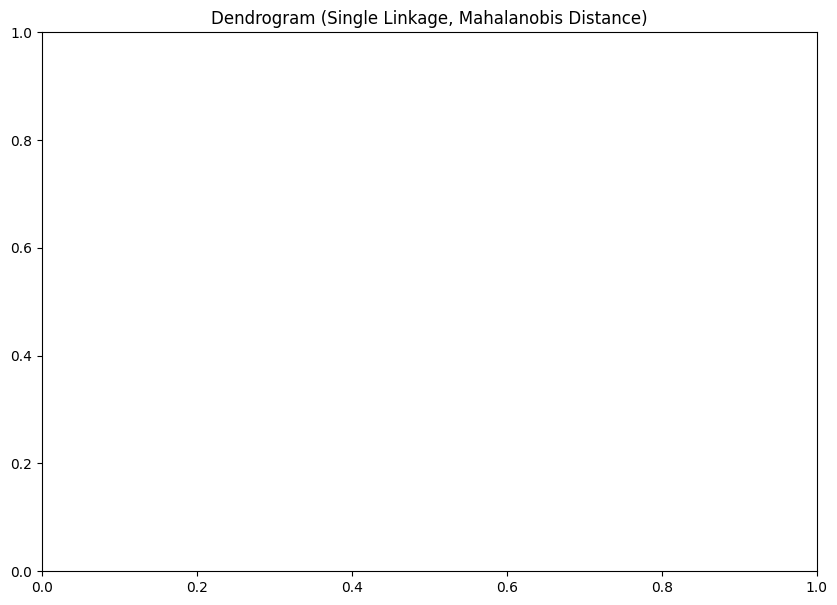

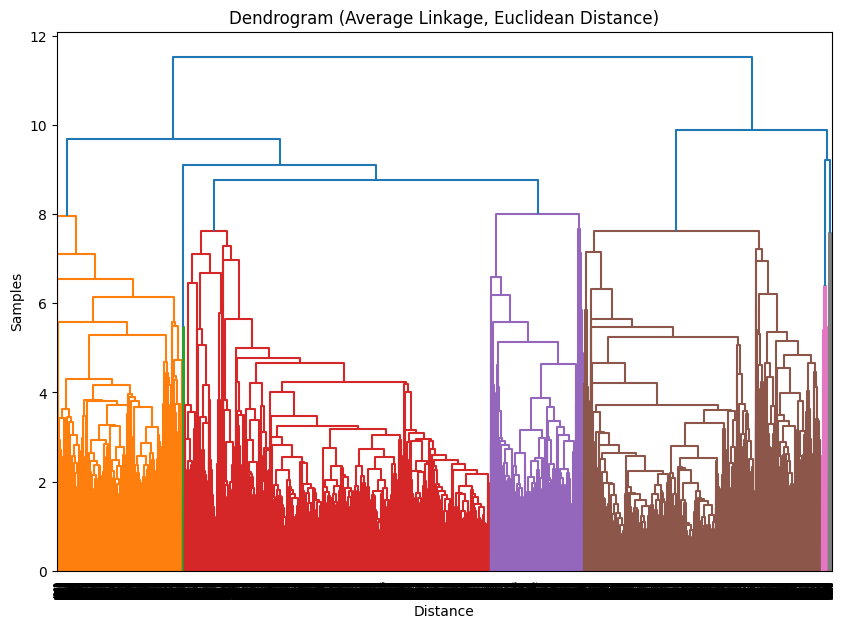

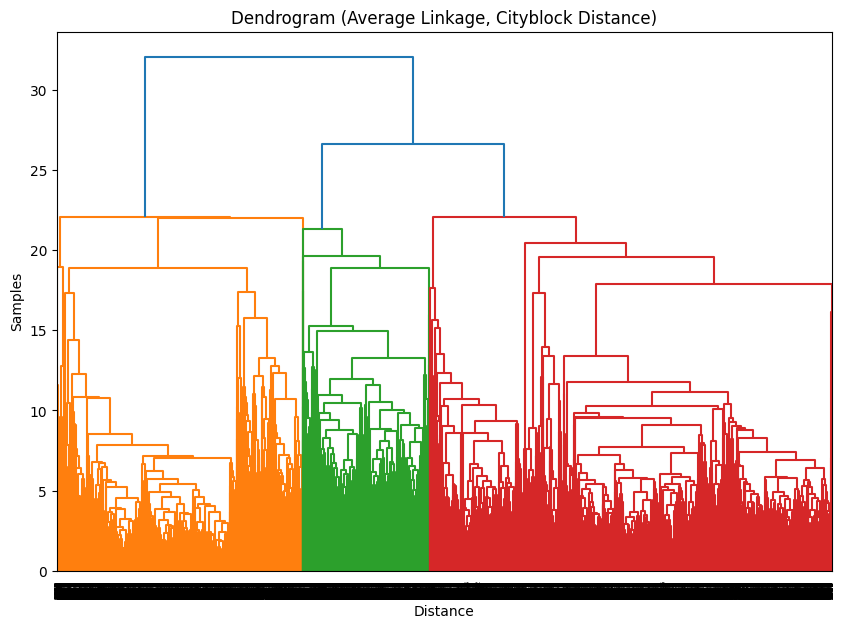

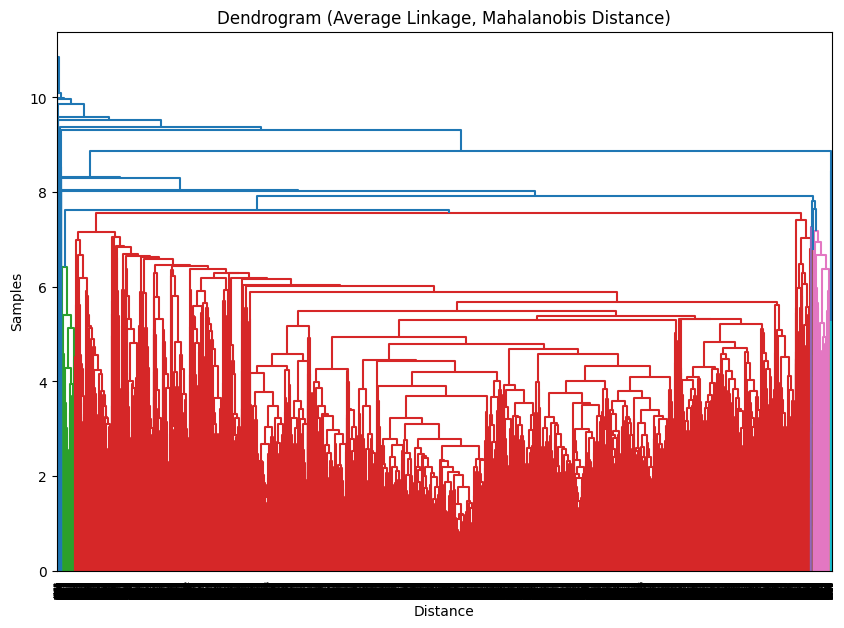

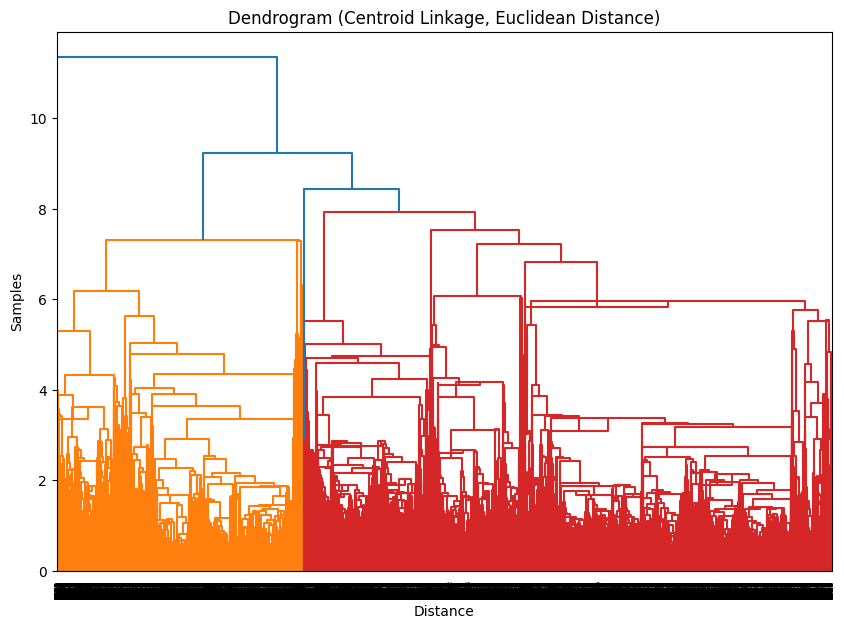

ValueError: Method 'centroid' requires the distance metric to be Euclidean.. Skipping...
ValueError: Method 'centroid' requires the distance metric to be Euclidean.. Skipping...


In [152]:
import scipy.cluster.hierarchy as shc
import matplotlib.pyplot as plt

linkage_methods = ['complete', 'single', 'average', 'centroid']
distance_metrics = ['euclidean', 'cityblock', 'mahalanobis']

for method in linkage_methods:
    for metric in distance_metrics:
        try:
            if method == 'centroid' and metric != 'euclidean':
                raise ValueError("Method 'centroid' requires the distance metric to be Euclidean.")

            linkage_matrix = shc.linkage(df_copy, method=method, metric=metric)

            plt.figure(figsize=(10, 7))
            plt.title(f"Dendrogram ({method.capitalize()} Linkage, {metric.capitalize()} Distance)")
            dend = shc.dendrogram(linkage_matrix, orientation='top')
            plt.xlabel('Distance')
            plt.ylabel('Samples')
            plt.show()
        except RecursionError:
            print(f"RecursionError encountered for {method.capitalize()} linkage and {metric.capitalize()} distance. Skipping...")
        except ValueError as ve:
            print(f"ValueError: {ve}. Skipping...")


In [153]:
from sklearn.cluster import AgglomerativeClustering

optimal_clusters = 4
linkage_method = 'complete'
distance_metric = 'cityblock'

agg_clustering = AgglomerativeClustering(n_clusters=optimal_clusters, linkage=linkage_method, affinity=distance_metric)

agg_clustering.fit(df_copy)

cluster_labels = agg_clustering.labels_

df_copy['Final_Cluster'] = cluster_labels

In [154]:
sil_avg = silhouette_score(df_copy, cluster_labels)

print("Silhouette Score:", sil_avg)

Silhouette Score: 0.36107563871207327


Different evaluation metrics

In [155]:
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score

# Davies-Bouldin Index
db_index = davies_bouldin_score(df_copy, cluster_labels)

# Calinski-Harabasz Index
ch_index = calinski_harabasz_score(df_copy, cluster_labels)

print("Davies-Bouldin Index:", db_index)
print("Calinski-Harabasz Index:", ch_index)

Davies-Bouldin Index: 1.1311741328495755
Calinski-Harabasz Index: 5845.915823268597


DB index: suggests that there is some overlap or variability in cluster compactnessbut overall i think its pretty well-separated

CH index: indicates that the clusters are well-separated and have distinct boundaries


## 6. <a name="6">improvement ideas</a>
(<a href="#0">Go to top</a>)

In [156]:
pip install gap-stat

Optimal number of clusters: 10
Silhouette Score: 0.34061702562197194


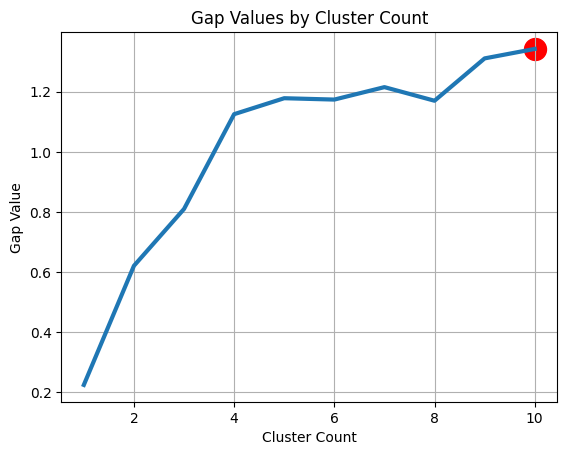

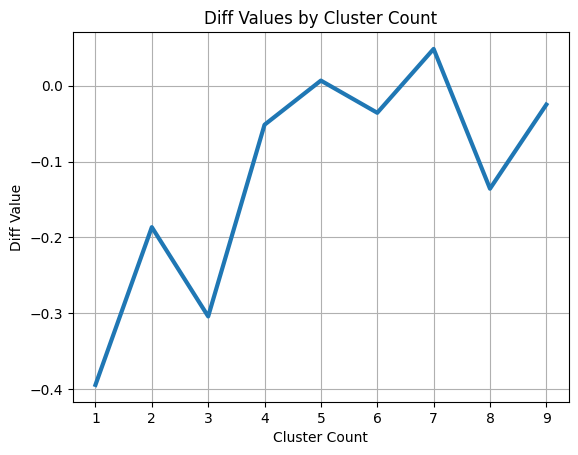

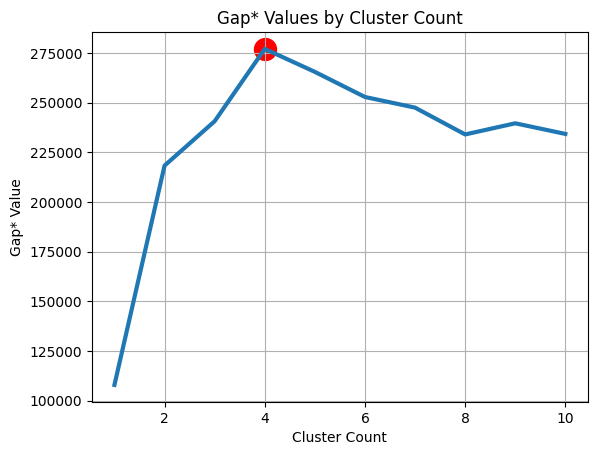

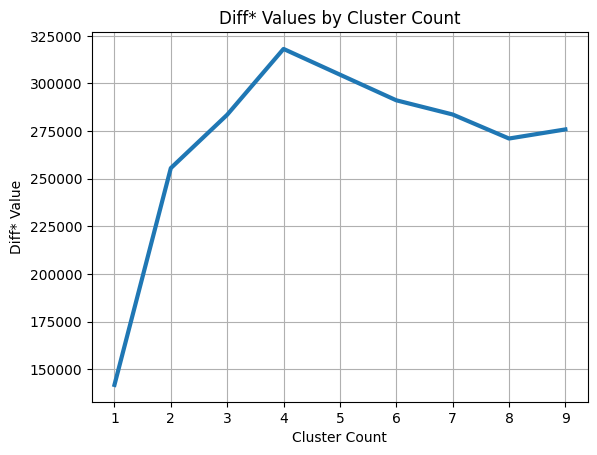

In [157]:
from gap_statistic import OptimalK

# Instantiate the OptimalK class
optimalK = OptimalK(parallel_backend='joblib')

n_clusters = optimalK(df_copy.values, cluster_array=np.arange(1, 11))

print("Optimal number of clusters:", n_clusters)

kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(df_copy)

cluster_labels = kmeans.labels_

# Evaluate clustering using silhouette score
silhouette_avg = silhouette_score(df_copy, cluster_labels)
print("Silhouette Score:", silhouette_avg)

df_copy['Gap_Cluster'] = cluster_labels

# Plot the gap statistics
optimalK.plot_results()

plt.show()

In [161]:
from sklearn.cluster import AgglomerativeClustering

optimal_clusters = 10

agg_clustering = AgglomerativeClustering(n_clusters=optimal_clusters)

agg_clustering.fit(df_copy)

cluster_labels = agg_clustering.labels_

df_copy['Final_Cluster2'] = cluster_labels

In [162]:
sil_avg = silhouette_score(df_copy, cluster_labels)

print("Silhouette Score:", sil_avg)

Silhouette Score: 0.4789943960043594


In [163]:
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score

# Davies-Bouldin Index
db_index = davies_bouldin_score(df_copy, cluster_labels)

# Calinski-Harabasz Index
ch_index = calinski_harabasz_score(df_copy, cluster_labels)

print("Davies-Bouldin Index:", db_index)
print("Calinski-Harabasz Index:", ch_index)

Davies-Bouldin Index: 0.9605910090484338
Calinski-Harabasz Index: 5548.72583839338


reduce features using pca


In [178]:
pca = PCA(n_components=0.8)
X_pca_normalized = pca.fit_transform(X_normalized)

In [179]:
X_tsne_pca_normalized = tsne.fit_transform(X_pca_normalized)

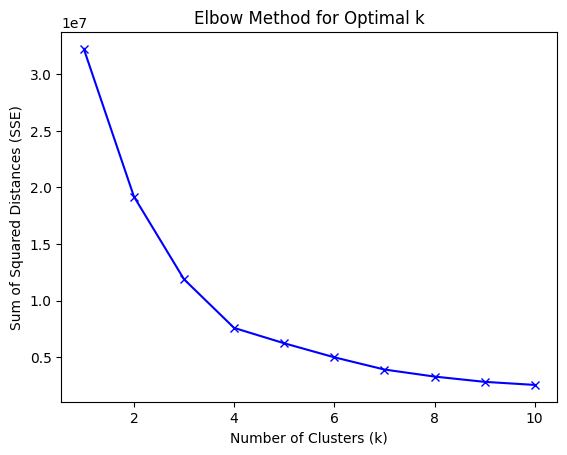

Optimal number of clusters (k): 4


In [180]:
# Define a range of k values for KMeans
k_values = range(1, 11)

# SSE (sum of squared distances)
sse = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)

    kmeans.fit(X_tsne_pca_normalized)

    # Append the inertia (sum of squared distances) to the list
    sse.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(k_values, sse, 'bx-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Sum of Squared Distances (SSE)')
plt.title('Elbow Method for Optimal k')
plt.show()

# Use the KneeLocator to determine the elbow point (optimal K)
kl = KneeLocator(list(k_values), sse, curve='convex', direction='decreasing')

optimal_k = kl.elbow

print("Optimal number of clusters (k):", optimal_k)

In [181]:
kmeans = KMeans(n_clusters=optimal_k, random_state=42)

kmeans.fit(X_tsne_pca_normalized)

cluster_labels = kmeans.labels_

df_copy['Reduced_cluster'] = cluster_labels

In [182]:
X_reduced = tsne.fit_transform(X_tsne_pca_normalized)

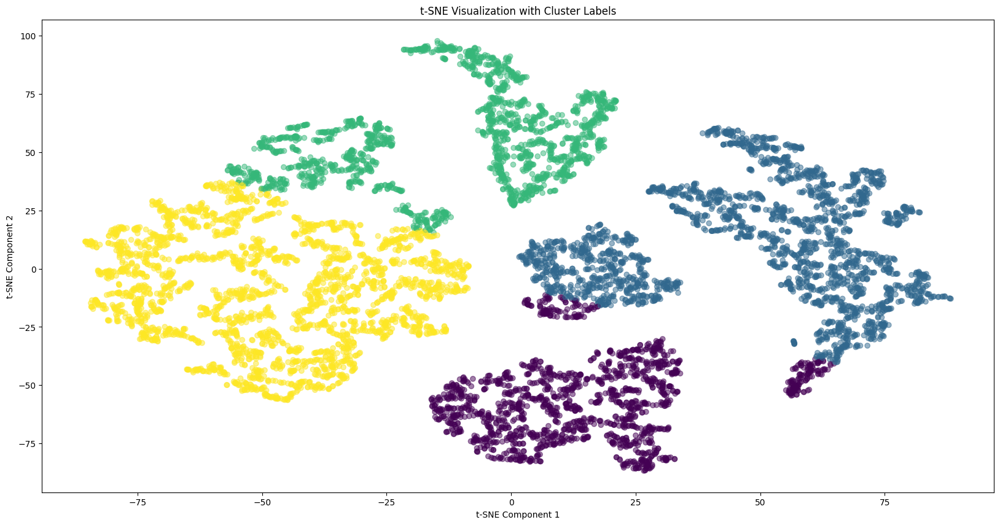

In [183]:
plot_tsne(X_tsne_pca_normalized, cluster_labels, 't-SNE Visualization with Cluster Labels')

In [184]:
sil_avg = silhouette_score(df_copy, cluster_labels)

print("Silhouette Score:", sil_avg)

Silhouette Score: 0.29730231588467226


In [185]:
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score

# Davies-Bouldin Index
db_index = davies_bouldin_score(df_copy, cluster_labels)

# Calinski-Harabasz Index
ch_index = calinski_harabasz_score(df_copy, cluster_labels)

print("Davies-Bouldin Index:", db_index)
print("Calinski-Harabasz Index:", ch_index)

Davies-Bouldin Index: 1.4854838335404774
Calinski-Harabasz Index: 3335.574458417905


In [186]:
from sklearn.preprocessing import MinMaxScaler

scaler_minmax = MinMaxScaler()

X_minmax_scaled = scaler_minmax.fit_transform(df_copy)

X_tsne_minmax = tsne.fit_transform(X_minmax_scaled)

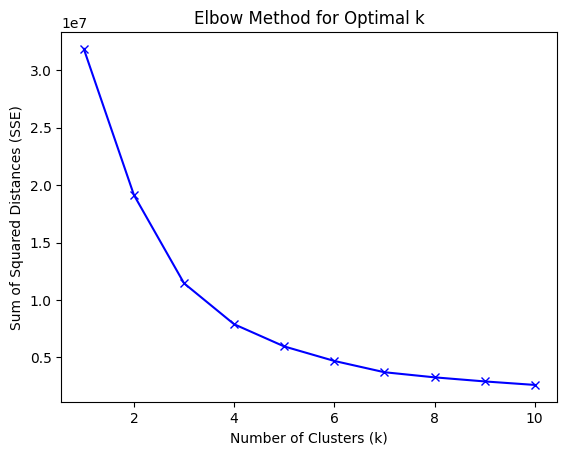

Optimal number of clusters (k): 4


In [188]:
# Define a range of k values for KMeans
k_values = range(1, 11)

# SSE (sum of squared distances)
sse = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)

    kmeans.fit(X_tsne_minmax)

    # Append the inertia (sum of squared distances) to the list
    sse.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(k_values, sse, 'bx-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Sum of Squared Distances (SSE)')
plt.title('Elbow Method for Optimal k')
plt.show()

# Use the KneeLocator to determine the elbow point (optimal K)
kl = KneeLocator(list(k_values), sse, curve='convex', direction='decreasing')

optimal_k = kl.elbow

print("Optimal number of clusters (k):", optimal_k)

In [189]:
kmeans = KMeans(n_clusters=optimal_k, random_state=42)

kmeans.fit(X_tsne_minmax)

cluster_labels = kmeans.labels_

df_copy['MinMax_cluster'] = cluster_labels

In [190]:
X_tsne_scaled = tsne.fit_transform(X_tsne_minmax)

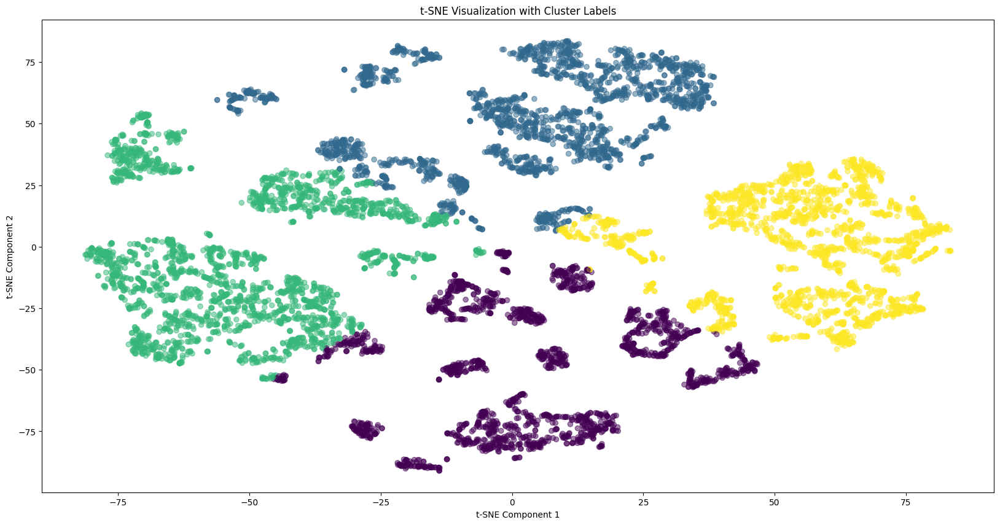

In [191]:
plot_tsne(X_tsne_minmax, cluster_labels, 't-SNE Visualization with Cluster Labels')